# Laporan Proyek Machine Learning -  Rekomendasi Film
by Handerson Loriano

In [1]:
# google colab settings
from google.colab.data_table import DataTable
DataTable.max_columns = 120

# Import Lib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

## Project Overview
### Pendahuluan
[<sup>[1]</sup>](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9269752/)Sistem rekomendasi Film bertujuan untuk memberikan sugesti kepada *customer* berdasarkan fitur-fitur yang disukai pada *Customer*. Sistem rekomendasi yang terbaik adalah mampu memberikan sugesti film yang cocok dengan kesamaan *Customer* dalam performa yang tinggi.

Seiringan dengan perkembangan teknologi yang pesat, beberapa pelaku bisnis perusahaan ditantang untuk memberikan rekomendasi cepat dan relevan. Untuk itu sistem rekomendasi dibutuhkan untuk memecahkan masalah yang kompleks karena, penyesuaian dari masing-masing pihak pengguna berbeda-beda, waktu, lingkungan dan juga kebudayaannya masing-masing.

Contohnya, Sistem rekomendasi *youtube* (Nama popularnya '*Youtube Algorithm*') merekomendasikan pengunjung yang berada disuatu tempat

![image](https://drive.google.com/uc?id=1Le8PvVE9AHgEdbP1xiCPprB5m64VS6Rj&export=download)

Hal ini menyebabkan pengguna ingin melihat bagian yang ingin dieksplorasi dan meningkatkan peluang untuk video yang banyak ingin dilihat. Tentunya ini akan menambah *revenue* bagi pemilik video dan *Channel*-nya

### Rumusan Permasalahan Awal
1. Mempengaruhi seseorang dengan kesamaan relevansi dalam waktu singkat
2. Analisa dari sudut pandang *customer* sangatlah sulit :
  - *Customer* memiliki pandangan yang berbeda-beda dan data yang sangat besar
  - *Customer* tidak semua data bisa menjadi relevan untuk diolah sistem rekomendasi karena, beberapa data-data yang dimiliki *customer* tidak bisa dijadikan acuan yang tepat.


## Business Understanding
Bila ingin merekomendasi suatu film tentunya harus ada kedekatan konten yang ingin dipertunjukan dari segi manapun. Misalnya, bila seseorang menikmati film bergenre '*Animation*' tentunya ia akan memilih film '*Animation*' yang lainnya. Tentu saja penikmat film bisa saja berubah, bisa saja ia ingin melihat film tentang '*Documentary*'. Akan tetapi, rekomendasi harus mendekati diantara '*Animation*' dan '*Documentary*' maka, penikmat film akan selalu menikmatinya

### Problem Statements
1. *Genre* apa yang memiliki rating tertinggi?
2. Apa rekomendasi film untuk orang yang ber*genre* *Horror*?

### Goals
1. Mengetahui '*Genre*' yang mempunyai rating tertinggi
2. Membuat model *machine learning Content-Based filtering* yang dapat memprediksi film rekomendasi dan diukur berdasarkan metrik *Precision @K*.
Semakin banyak *genre* yang mempunyai kesamaan pada film maka semakin besar peluang penikmat film akan menonton film ber*genre* kesukaannya.

Pada contoh ini adalah film ber*genre* horror

## Data Understanding
Ini adalah tahapan yang dilakukan pada *Data Understanding* :
1. Melakukan *Data Loading* supaya bisa membaca sumber dari yang sudah ada dan mengikuti arti data yang baik
2. Mendeskripsikan data supaya bisa melihat pola apa saja yang bisa disiapkan pada tahapan *Data Preparation*
3. Menyaring *missing Value* dan *Outliers*
4. Melakukan *EDA Univariate analysis* supaya dapat melihat total data yang dapat lihat
5. Melakukan *EDA Multivariate analysis* untuk fitur kategorikal untuk mencari hubungan yang sesuai

Info Dataset :
1. Nama Dataset : NetflixOriginals
2. total : 584

Berikut ini adalah maksud / arti dari nama kolom tersebut :
1. *Title* = judul film
2. *Genre* = jenis film
3. *Premiere* = tanggal film tayangan
4. *Runtime* = lamanya film berjalan (dalam menit)
5. *IMDB Score* = nilai rating film dari IMDB (0 - 10)
6. *Language* = bahasa film tayangan

proses yang akan dilakukan pada tahapan ini adalah :
1. *Data loading*
2. *Exploratory Data Analysis*

Pada penggalian data pada tahap *Exploratory Data analysis* :
1. Menemukan Kolom cell *Language* yang sepertinya berganda dan beberapa dari bahasa tersebut ditemukan menyatu dengan satu sama lain. Data unik ini bisa dinamakan *multilabel classification*, yang dimana beberapa data menjadi satu tapi masih terkaitan dengan maknanya. Sehingga bisa dilihat pada perhitungan *univariate analysi*s lumayan banyak dan komplex
2. Uniknya pada data ini memiliki korelasi lemah terhadap '*Runtime*' dan '*Premiere*'. Ini berarti, penayangan tanggal film-film yang telat berpotensi mempunyai film dengan jangka tayang yang lebih lama dari tanggal-tanggal yang sebelumnya

### Data Loading
Data yang berasal dari sumber ini[<sup>[6]</sup>](https://www.kaggle.com/datasets/luiscorter/netflix-original-films-imdb-scores) :
1. setelah diunduh, harus diunggah ke *google drive*
2. dan mengubah akses supaya bisa pakai di *google colab*

Pada tahap *data loading* akan melakukan pengambilan data dan menyeleksi kolom yang perlu diperhatikan

In [2]:
!mkdir 'content'
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1TqlJPWPfzy2pcPcMzV5SjVn4OzZw_vIP&confirm=t' -O './content/NetflixOriginals.csv'
dataframe_recfilm = pd.read_csv("./content/NetflixOriginals.csv", encoding = "ISO-8859-1")

--2023-11-23 13:11:36--  https://docs.google.com/uc?export=download&id=1TqlJPWPfzy2pcPcMzV5SjVn4OzZw_vIP&confirm=t
Resolving docs.google.com (docs.google.com)... 108.177.121.138, 108.177.121.113, 108.177.121.101, ...
Connecting to docs.google.com (docs.google.com)|108.177.121.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-28-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9mmrsauuuvb0nu2766jcrmqkjcqleprk/1700745075000/04913636691939601199/*/1TqlJPWPfzy2pcPcMzV5SjVn4OzZw_vIP?e=download&uuid=e1e37349-054a-4685-a26a-2588d1cb9af2 [following]
--2023-11-23 13:11:36--  https://doc-00-28-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9mmrsauuuvb0nu2766jcrmqkjcqleprk/1700745075000/04913636691939601199/*/1TqlJPWPfzy2pcPcMzV5SjVn4OzZw_vIP?e=download&uuid=e1e37349-054a-4685-a26a-2588d1cb9af2
Resolving doc-00-28-docs.googleusercontent.com (doc-00-28-docs.googleusercontent.com)... 74.125.124.1

In [3]:
dataframe_recfilm

,Title,Genre,Premiere,Runtime,IMDB Score,Language
0,Enter the Anime,Documentary,"August 5, 2019",58,2.5,English/Japanese
1,Dark Forces,Thriller,"August 21, 2020",81,2.6,Spanish
2,The App,Science fiction/Drama,"December 26, 2019",79,2.6,Italian
3,The Open House,Horror thriller,"January 19, 2018",94,3.2,English
4,Kaali Khuhi,Mystery,"October 30, 2020",90,3.4,Hindi
...,...,...,...,...,...,...
579,Taylor Swift: Reputation Stadium Tour,Concert Film,"December 31, 2018",125,8.4,English
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,"October 9, 2015",91,8.4,English/Ukranian/Russian
581,Springsteen on Broadway,One-man show,"December 16, 2018",153,8.5,English
582,Emicida: AmarElo - It's All For Yesterday,Documentary,"December 8, 2020",89,8.6,Portuguese


### Exploratory Data Analysis
Ini adalah tahapan yang akan dilakukan :
1. Mendeskripsikan variabel kolom
2. menganalisis untuk mencari *missing value* dan *outliers*
3. Menggunakan cara *univariate analysis* untuk analisis data dan menjawab pertanyaan bisnis

#### Exploratory Data Analysis - Deskripsi Variabel

In [4]:
dataframe_recfilm

,Title,Genre,Premiere,Runtime,IMDB Score,Language
0,Enter the Anime,Documentary,"August 5, 2019",58,2.5,English/Japanese
1,Dark Forces,Thriller,"August 21, 2020",81,2.6,Spanish
2,The App,Science fiction/Drama,"December 26, 2019",79,2.6,Italian
3,The Open House,Horror thriller,"January 19, 2018",94,3.2,English
4,Kaali Khuhi,Mystery,"October 30, 2020",90,3.4,Hindi
...,...,...,...,...,...,...
579,Taylor Swift: Reputation Stadium Tour,Concert Film,"December 31, 2018",125,8.4,English
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,"October 9, 2015",91,8.4,English/Ukranian/Russian
581,Springsteen on Broadway,One-man show,"December 16, 2018",153,8.5,English
582,Emicida: AmarElo - It's All For Yesterday,Documentary,"December 8, 2020",89,8.6,Portuguese


In [5]:
dataframe_recfilm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 584 entries, 0 to 583
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Title       584 non-null    object 
 1   Genre       584 non-null    object 
 2   Premiere    584 non-null    object 
 3   Runtime     584 non-null    int64  
 4   IMDB Score  584 non-null    float64
 5   Language    584 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 27.5+ KB


In [6]:
dataframe_recfilm.describe(include="all")

,Title,Genre,Premiere,Runtime,IMDB Score,Language
count,584,584,584,584.000000,584.000000,584
unique,584,115,390,NaN,NaN,38
top,Enter the Anime,Documentary,"October 2, 2020",NaN,NaN,English
freq,1,159,6,NaN,NaN,401
mean,NaN,NaN,NaN,93.577055,6.271747,NaN
std,NaN,NaN,NaN,27.761683,0.979256,NaN
min,NaN,NaN,NaN,4.000000,2.500000,NaN
25%,NaN,NaN,NaN,86.000000,5.700000,NaN
50%,NaN,NaN,NaN,97.000000,6.350000,NaN
75%,NaN,NaN,NaN,108.000000,7.000000,NaN


In [7]:
dataframe_recfilm.corr(method ='pearson', numeric_only=True)

,Runtime,IMDB Score
Runtime,1.000000,-0.040896
IMDB Score,-0.040896,1.000000


#### Exploratory Data Analysis - Missing Value & outliers
1. Melihat *missing value*. Tidak ada *missing value* yang relevan
2. Mengubah data tanggal menjadi angka yang bisa diproses untuk pengecekan *outliers*
3. Memproses data *numerical* yang berada di jangkauan *outlier* memakai, metode *IQR*. Untuk memproses value yang dapat mengacaukan pada tahap *modeling*

In [8]:
# melihat missing value
dataframe_recfilm.isnull().sum()

Title         0
Genre         0
Premiere      0
Runtime       0
IMDB Score    0
Language      0
dtype: int64

In [9]:
dataframe_recfilm.shape

(584, 6)

In [10]:
dataframe_recfilm

,Title,Genre,Premiere,Runtime,IMDB Score,Language
0,Enter the Anime,Documentary,"August 5, 2019",58,2.5,English/Japanese
1,Dark Forces,Thriller,"August 21, 2020",81,2.6,Spanish
2,The App,Science fiction/Drama,"December 26, 2019",79,2.6,Italian
3,The Open House,Horror thriller,"January 19, 2018",94,3.2,English
4,Kaali Khuhi,Mystery,"October 30, 2020",90,3.4,Hindi
...,...,...,...,...,...,...
579,Taylor Swift: Reputation Stadium Tour,Concert Film,"December 31, 2018",125,8.4,English
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,"October 9, 2015",91,8.4,English/Ukranian/Russian
581,Springsteen on Broadway,One-man show,"December 16, 2018",153,8.5,English
582,Emicida: AmarElo - It's All For Yesterday,Documentary,"December 8, 2020",89,8.6,Portuguese


In [11]:
# mengubah date menjadi angka
# membetulkan titik dan koma
for col, row in dataframe_recfilm.iterrows() :
  if '.' in dataframe_recfilm.at[col, 'Premiere']  :
    dataframe_recfilm.at[col, 'Premiere'] = dataframe_recfilm.at[col, 'Premiere'].replace('.', ",")

dataframe_recfilm["Premiere"] = pd.to_datetime(dataframe_recfilm["Premiere"], format='%B %d, %Y' )
dataframe_recfilm['Premiere'] = dataframe_recfilm['Premiere'].apply(lambda x: x.value)

<Axes: xlabel='Premiere'>

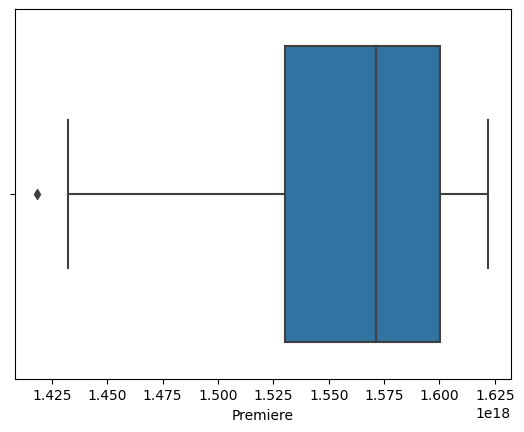

In [12]:
# melihat outliers Premiere
sns.boxplot(x=dataframe_recfilm['Premiere'])

In [13]:
dataframe_recfilm.shape

(584, 6)

In [14]:
# menangani outliers Premiere
Q1 = dataframe_recfilm.quantile(0.25, numeric_only=True)
Q3 = dataframe_recfilm.quantile(0.75, numeric_only=True)
IQR=Q3-Q1
qcombine = dataframe_recfilm.lt(Q1-1.5*IQR) | dataframe_recfilm.gt(Q3+1.5*IQR)
datadexing = qcombine.any(axis=1)
dataframe_recfilm_l1 =dataframe_recfilm[~datadexing]

dataframe_recfilm_l1.shape

(501, 6)

<Axes: xlabel='Runtime'>

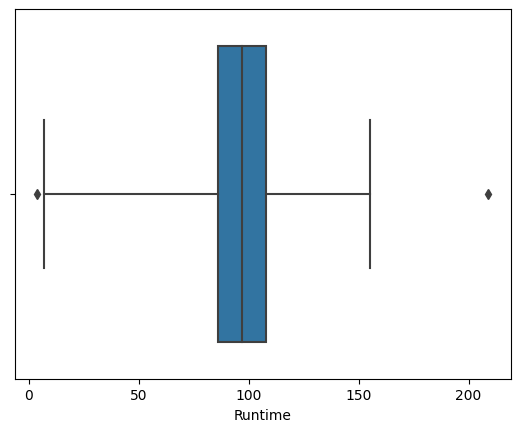

In [15]:
# menyesuaikan outliers Runtime
whis_runtime = 3.7
sns.boxplot(x=dataframe_recfilm['Runtime'], whis=whis_runtime)

In [16]:
dataframe_recfilm_l1.shape

(501, 6)

In [17]:
# menangani outliers Runtime
Q1 = dataframe_recfilm_l1.quantile(0.25, numeric_only=True)
Q3 = dataframe_recfilm_l1.quantile(0.75, numeric_only=True)
IQR=Q3-Q1
qcombine = dataframe_recfilm_l1.lt(Q1-whis_runtime*IQR) | dataframe_recfilm_l1.gt(Q3+whis_runtime*IQR)
datadexing = qcombine.any(axis=1)
dataframe_recfilm_l2 =dataframe_recfilm_l1[~datadexing]

dataframe_recfilm_l2.shape

(501, 6)

<Axes: xlabel='Runtime'>

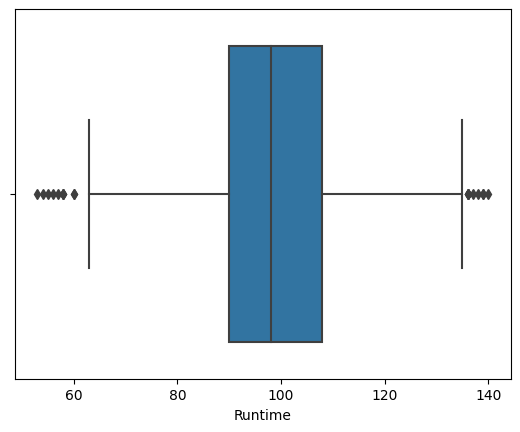

In [18]:
sns.boxplot(x=dataframe_recfilm_l2['Runtime'])

<Axes: xlabel='Runtime'>

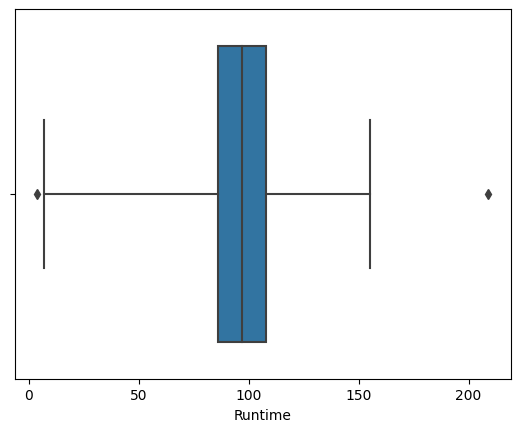

In [19]:

sns.boxplot(x=dataframe_recfilm['Runtime'], whis=whis_runtime)

<Axes: xlabel='IMDB Score'>

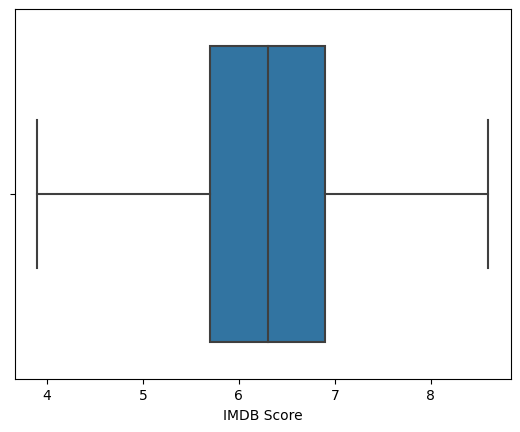

In [20]:
# melihat outliers IMDB Score
sns.boxplot(x=dataframe_recfilm_l2['IMDB Score'])

#### Exploratory Data Analysis - Univariate Analysis
1. Memproses *outliers* untuk *Language*.
2. Memproses *outliers* untuk *Genre*.

Terlihat ada beberapa data pada kolom '*Language*' terlihat ganda dan beberapa *variable* dari kolom tersebut sama dengan beberapa *variable* yang sendiri.

Ini adalah sifat dari *multilabel classification* yang nanti akan diolah pada tahap *data preparation*. untuk saat ini, mencari jawaban dari *business understanding*

|Data|Value|
|:------|:------|
|Title|David Attenborough : ALife on Our Planet|
|Genre|Documentary|
|Premiere|1601769600000000000|
|Runtime|83|
|IMDB Score|9.0|
|Language|English|

Terlihat genre '*Documentary*' mempunyai IMDB Score yang paling tinggi yang berjudul David Attenborough: A Life on Our Planet

In [21]:
dataframe_recfilm_l2

,Title,Genre,Premiere,Runtime,IMDB Score,Language
8,Paradox,Musical/Western/Fantasy,1521763200000000000,73,3.9,English
9,Sardar Ka Grandson,Comedy,1621296000000000000,139,4.1,Hindi
10,Searching for Sheela,Documentary,1619049600000000000,58,4.1,English
11,The Call,Drama,1606435200000000000,112,4.1,Korean
12,Whipped,Romantic comedy,1600387200000000000,97,4.1,Indonesian
...,...,...,...,...,...,...
576,Cuba and the Cameraman,Documentary,1511481600000000000,114,8.3,English
578,Ben Platt: Live from Radio City Music Hall,Concert Film,1589932800000000000,85,8.4,English
579,Taylor Swift: Reputation Stadium Tour,Concert Film,1546214400000000000,125,8.4,English
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,1444348800000000000,91,8.4,English/Ukranian/Russian


In [22]:
numerical_features = ['Premiere', 'Runtime', 'IMDB Score']
categorical_features = ['Title', 'Genre', 'Language']

                                      jumlah sampel  persentase
Documentary                                     122        24.4
Drama                                            73        14.6
Comedy                                           46         9.2
Romantic comedy                                  39         7.8
Thriller                                         31         6.2
...                                             ...         ...
Comedy mystery                                    1         0.2
Romantic thriller                                 1         0.2
Christmas comedy                                  1         0.2
War-Comedy                                        1         0.2
Animation/Christmas/Comedy/Adventure              1         0.2

[101 rows x 2 columns]


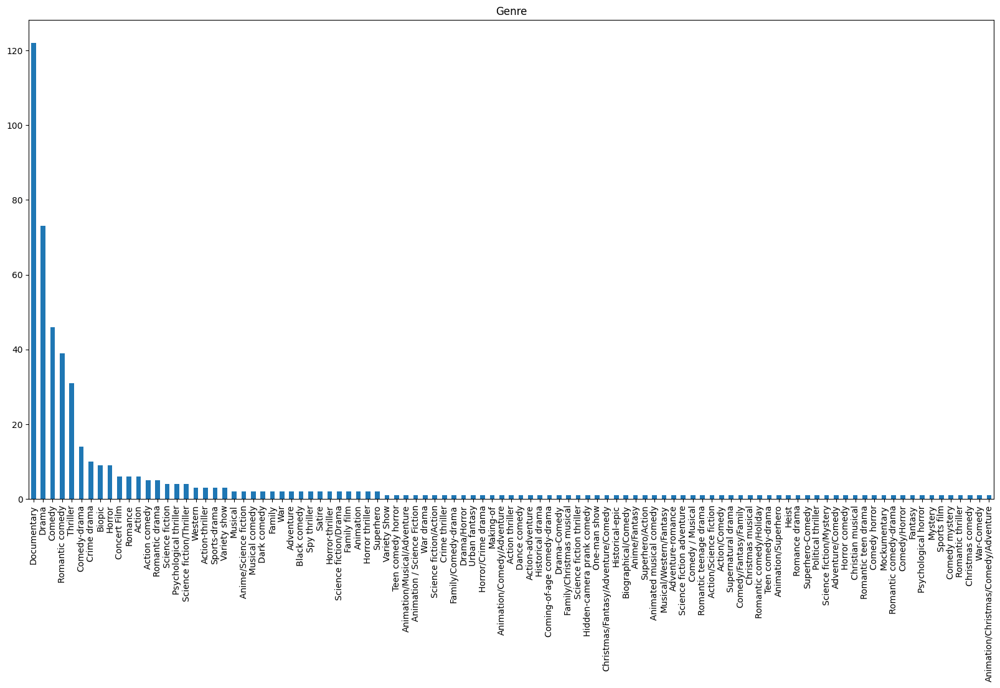

In [23]:
feature = categorical_features[1]
count = dataframe_recfilm_l2[feature].value_counts()
percent = 100*dataframe_recfilm_l2[feature].value_counts(normalize=True)
df = pd.DataFrame({'jumlah sampel':count, 'persentase':percent.round(1)})
print(df)
count.plot(kind='bar', title=feature, figsize=(20,10));

                            jumlah sampel  persentase
English                               345        68.9
Spanish                                28         5.6
Hindi                                  27         5.4
French                                 20         4.0
Italian                                13         2.6
Portuguese                             10         2.0
Indonesian                              9         1.8
Korean                                  6         1.2
German                                  5         1.0
Turkish                                 4         0.8
Dutch                                   3         0.6
Marathi                                 3         0.6
Japanese                                3         0.6
Polish                                  3         0.6
Thai                                    2         0.4
Filipino                                2         0.4
English/Akan                            1         0.2
English/Mandarin            

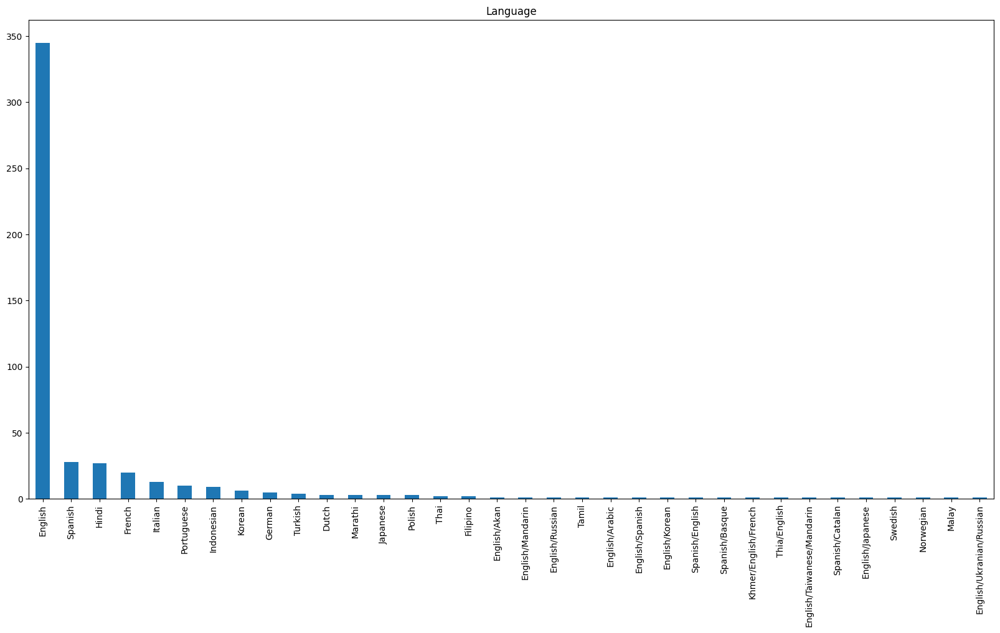

In [24]:
feature = categorical_features[2]
count = dataframe_recfilm_l2[feature].value_counts()
percent = 100*dataframe_recfilm_l2[feature].value_counts(normalize=True)
df = pd.DataFrame({'jumlah sampel':count, 'persentase':percent.round(1)})
print(df)
count.plot(kind='bar', title=feature, figsize=(20,10));

In [25]:
dataframe_recfilm.iloc[dataframe_recfilm['IMDB Score'].idxmax()]

Title         David Attenborough: A Life on Our Planet
Genre                                      Documentary
Premiere                           1601769600000000000
Runtime                                             83
IMDB Score                                         9.0
Language                                       English
Name: 583, dtype: object

#### Exploratory Data Analysis - Multivariate Analysis
Setelah kita lihat, tidak ada korelasi *variable* kolom dengan yang lain secara nyata

In [26]:
sns.set(font_scale=2)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Glyph 150 (\x96) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 150 (\x96) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 150 (\x96) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


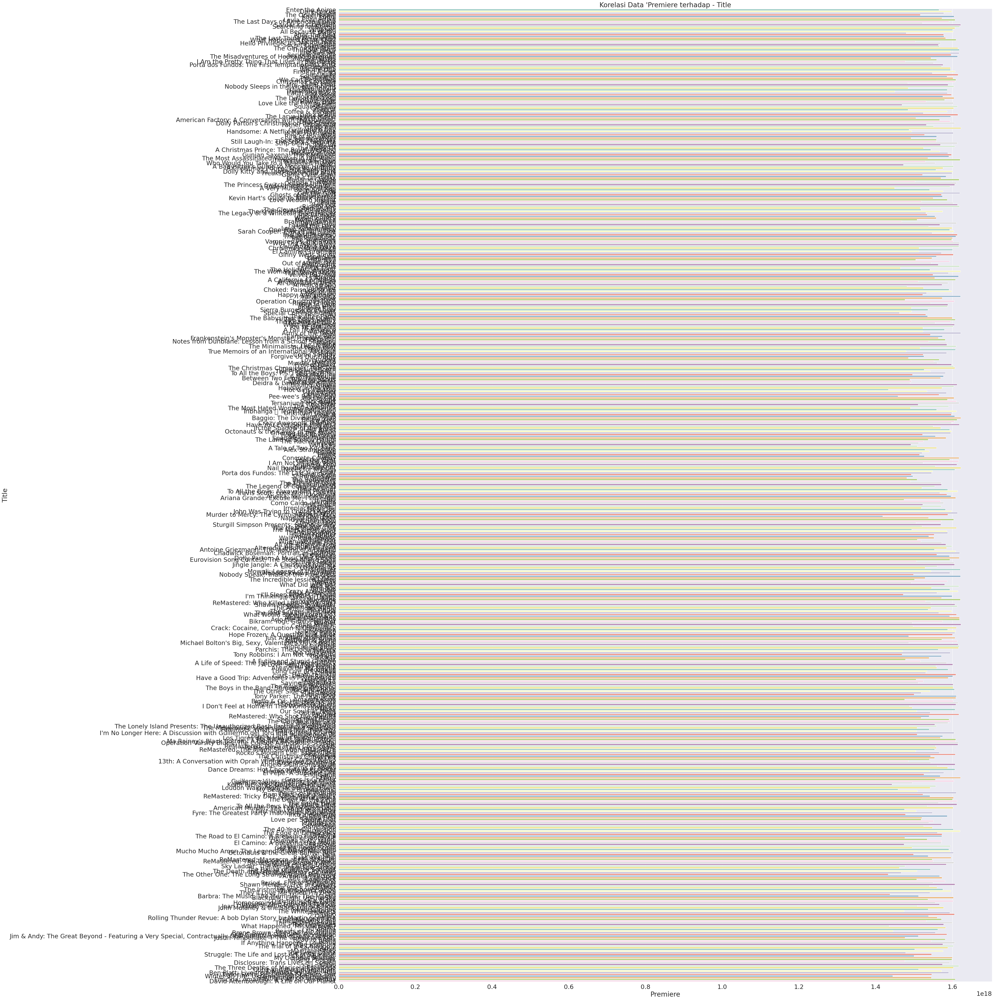

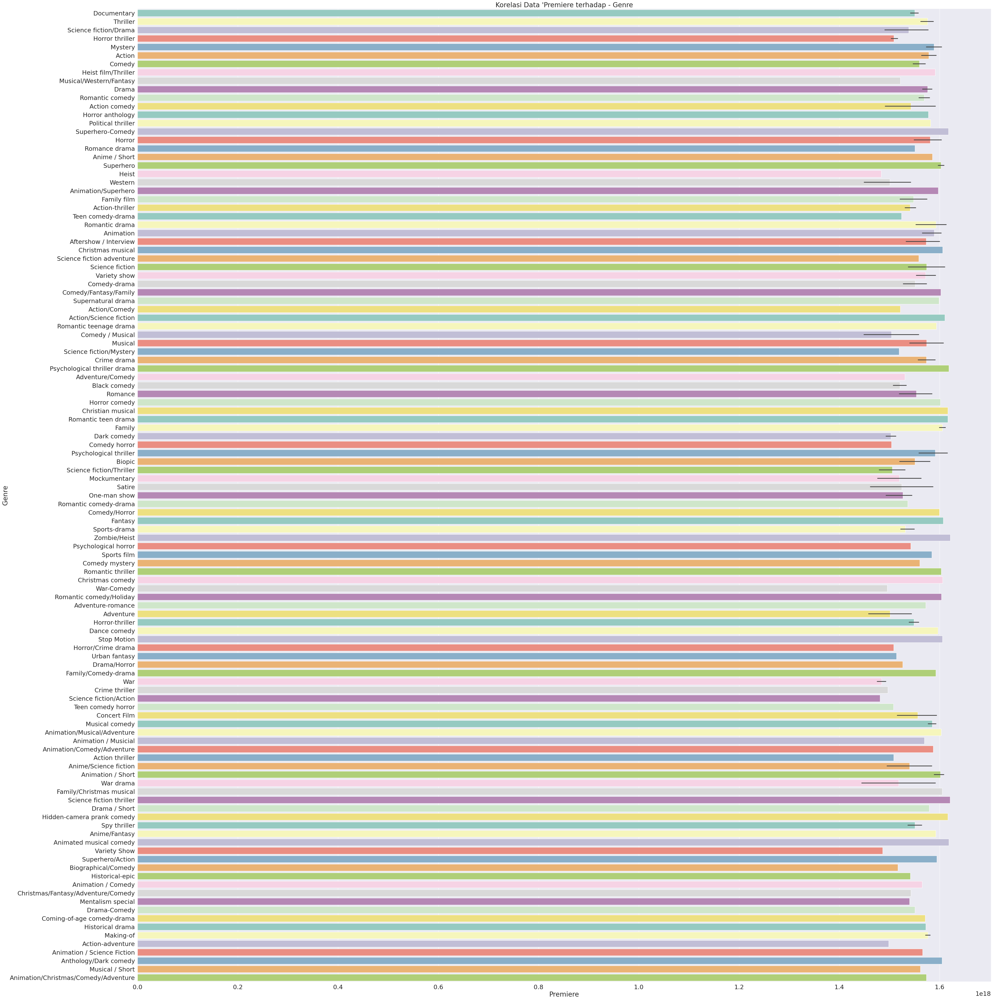

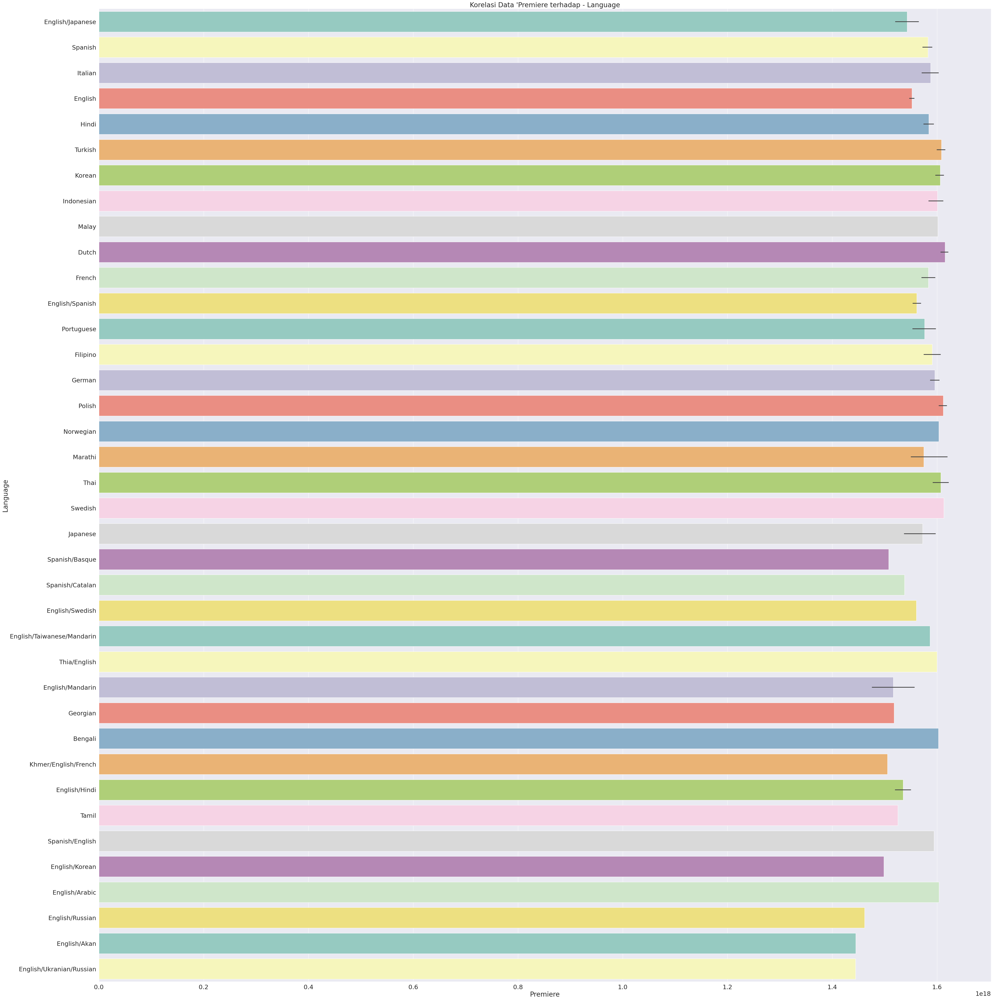

In [27]:
cat_features = dataframe_recfilm.select_dtypes(include='object').columns.to_list()

for col in cat_features:
  sns.catplot(x="Premiere", y=col, kind="bar", dodge=False, height = 50, aspect = 1,  data=dataframe_recfilm, palette="Set3")
  plt.title("Korelasi Data 'Premiere terhadap - {}".format(col))

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Glyph 150 (\x96) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 150 (\x96) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 150 (\x96) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


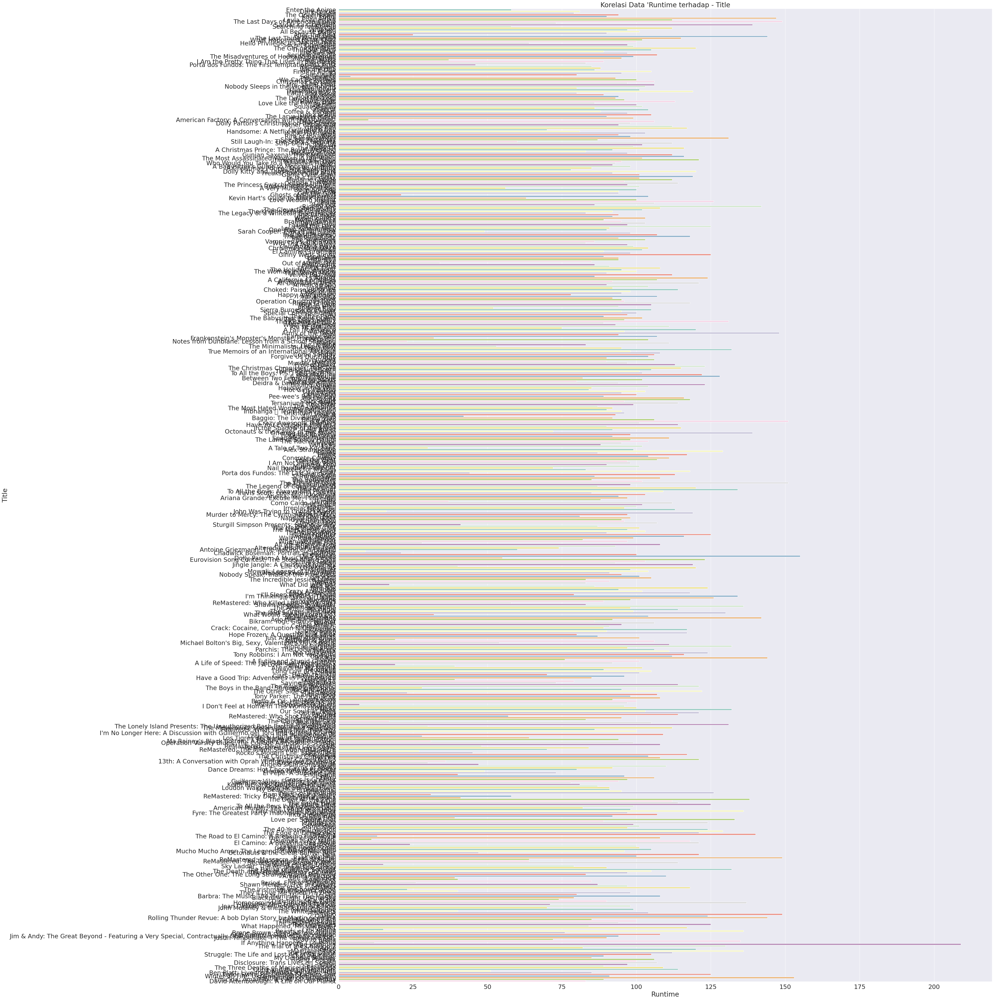

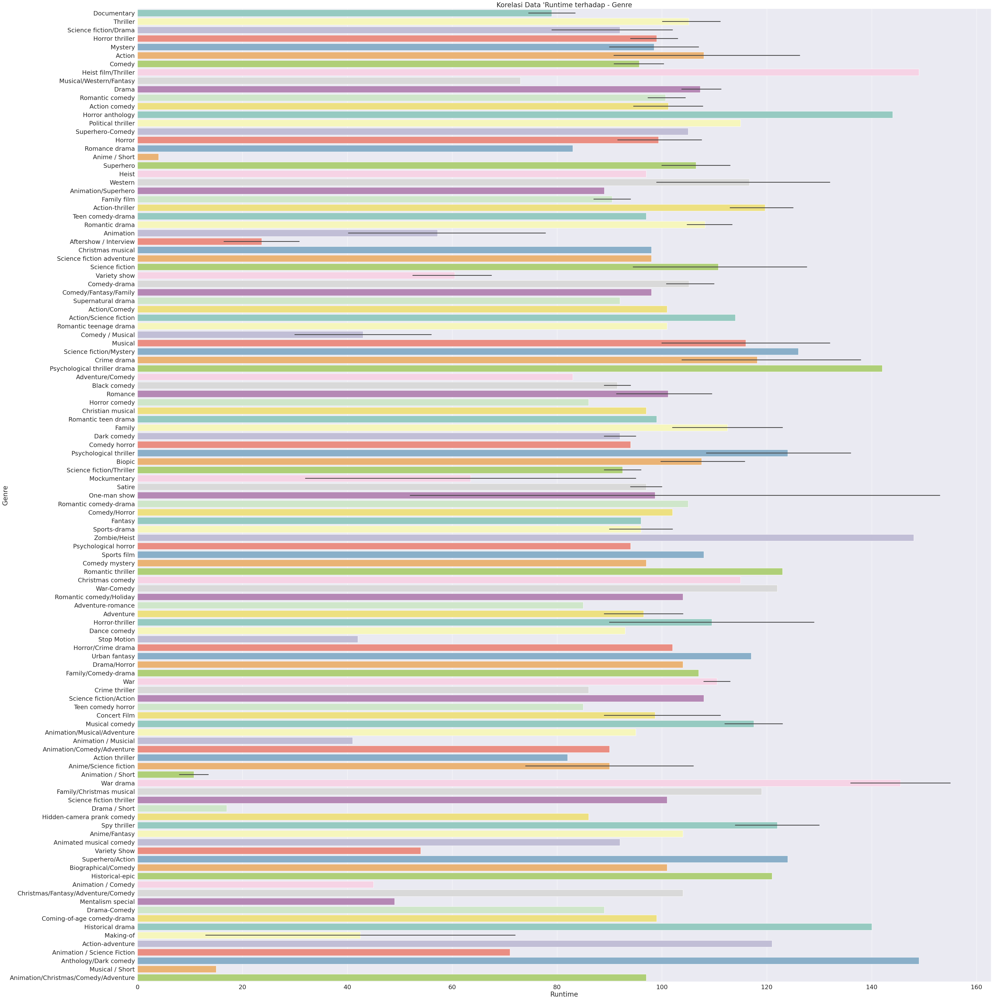

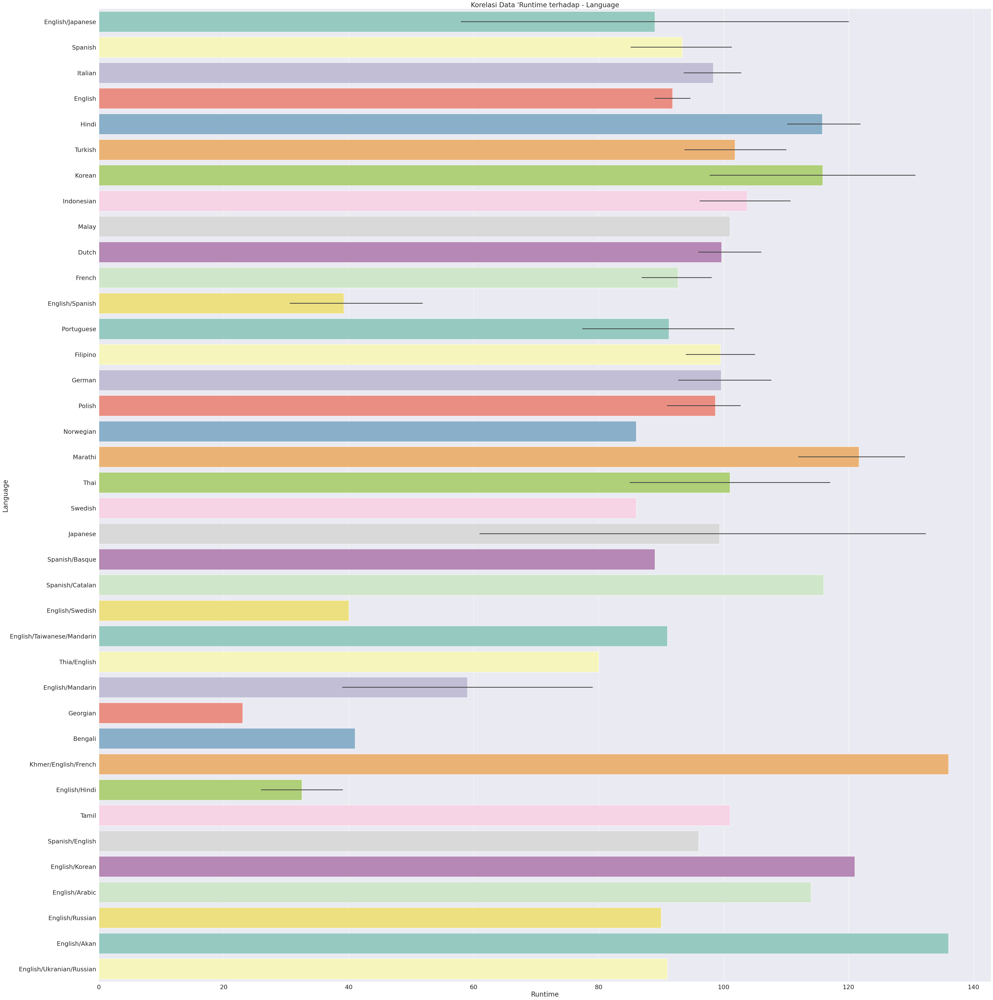

In [28]:
for col in cat_features:
  sns.catplot(x="Runtime", y=col, kind="bar", dodge=False, height = 50, aspect = 1,  data=dataframe_recfilm, palette="Set3")
  plt.title("Korelasi Data 'Runtime terhadap - {}".format(col))

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Glyph 150 (\x96) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 150 (\x96) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 150 (\x96) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


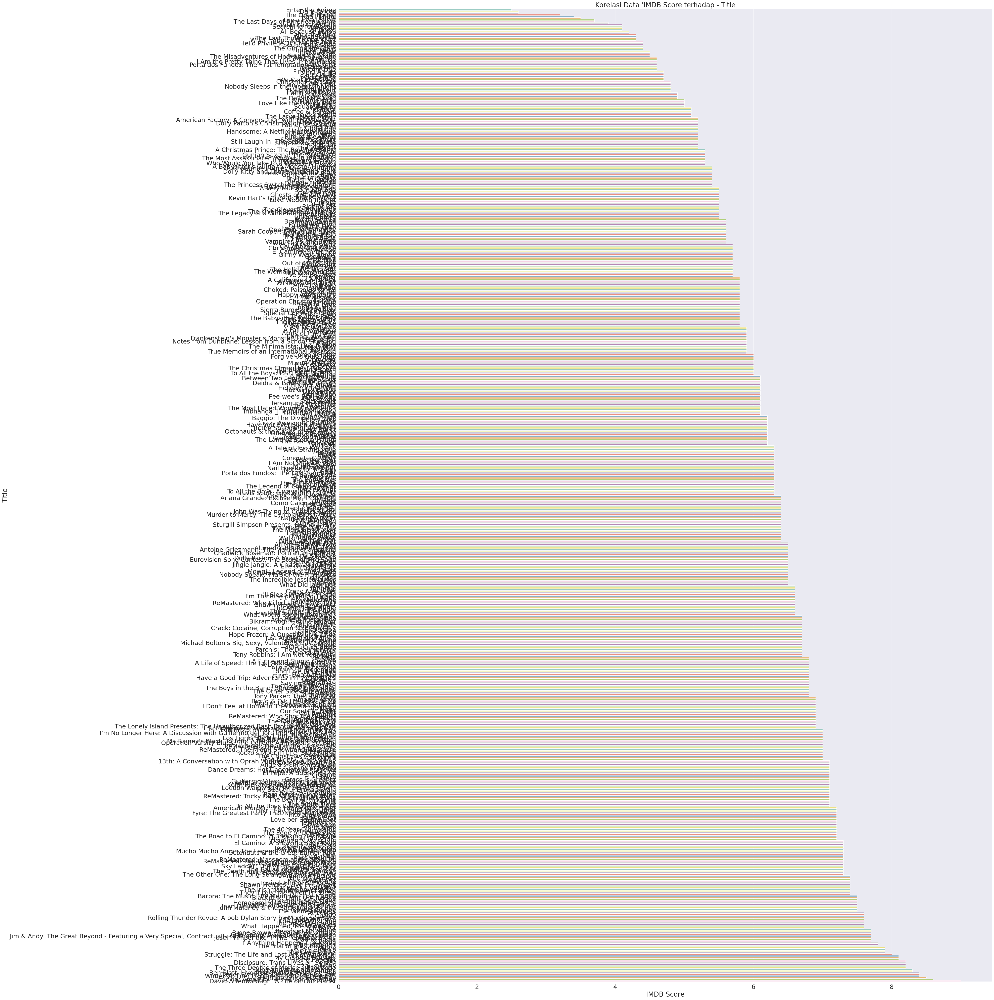

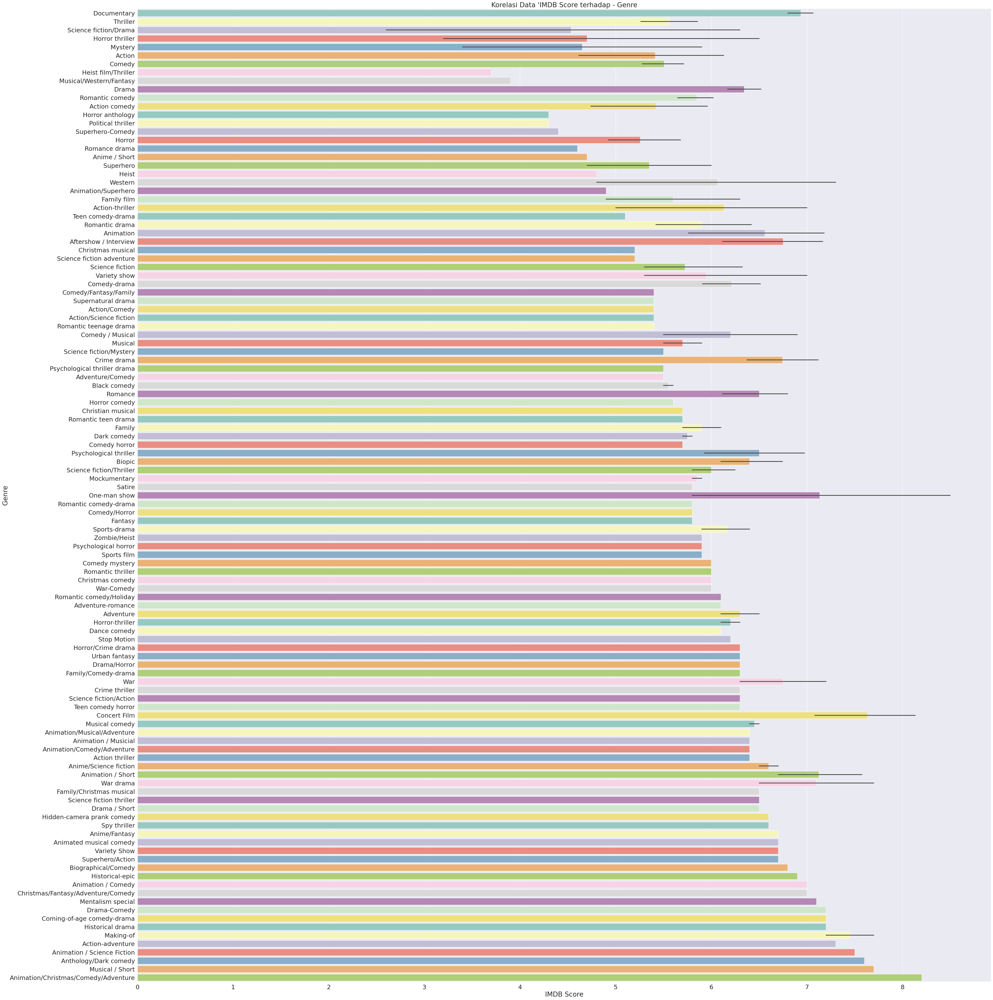

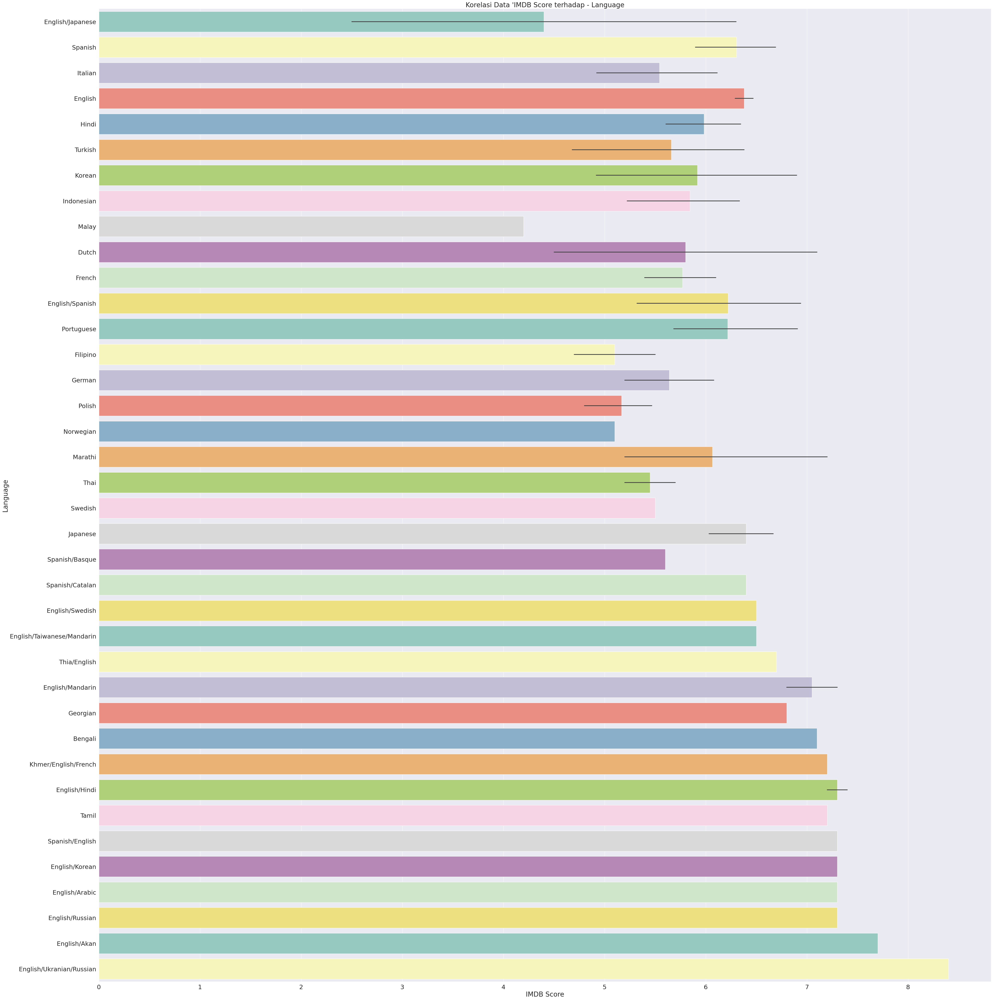

In [29]:
for col in cat_features:
  sns.catplot(x="IMDB Score", y=col, kind="bar", dodge=False, height = 50, aspect = 1,  data=dataframe_recfilm, palette="Set3")
  plt.title("Korelasi Data 'IMDB Score terhadap - {}".format(col))

In [30]:
sns.set(font_scale=1)

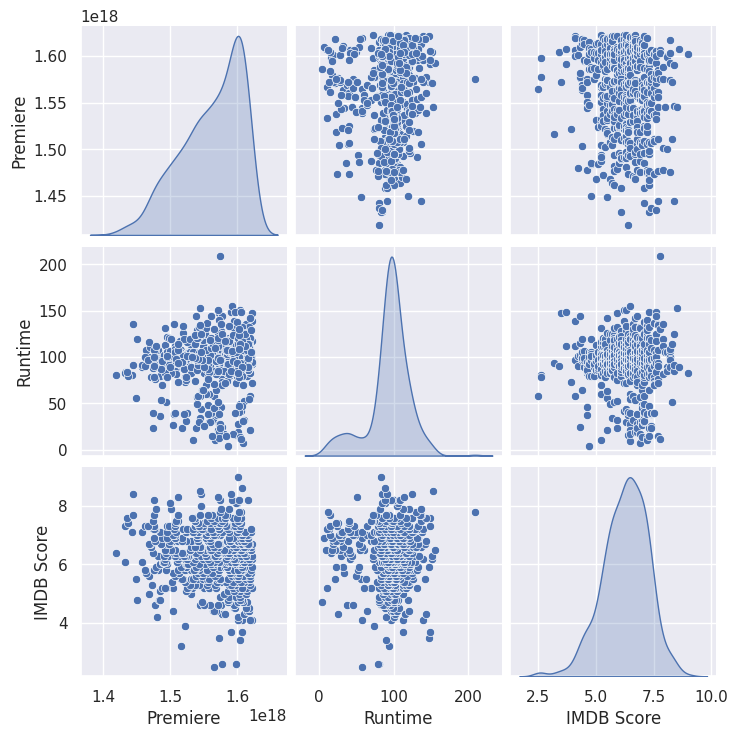

In [31]:
sns.pairplot(dataframe_recfilm, diag_kind = 'kde')

Text(0.5, 1.0, 'Correlation Matrix untuk Fitur Numerik ')

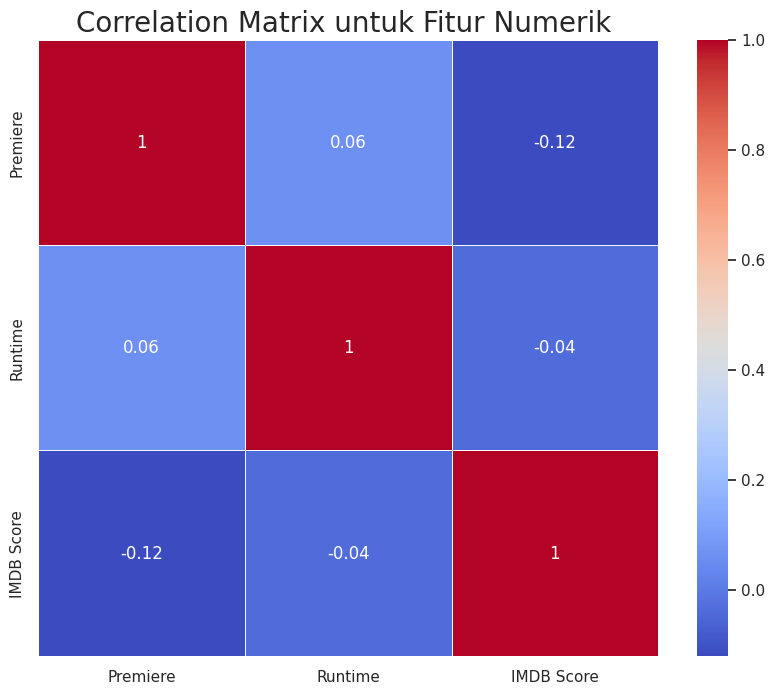

In [32]:
plt.figure(figsize=(10, 8))
correlation_matrix = dataframe_recfilm.corr(numeric_only=True).round(2)

# Untuk menge-print nilai di dalam kotak, gunakan parameter anot=True
sns.heatmap(data=correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, )
plt.title("Correlation Matrix untuk Fitur Numerik ", size=20)

## Data Preparation
Beberapa data sudah yang diproses untuk *missing value* dan *outliers* pada tahap *Exploratory data analysis* :
1. Menggunakan Metode *IQR* untuk mengatasi *outliers* pada kolom *Runtime* dan *Premiere*.
2. Tidak ada *Missing Value* atau data yang kosong. Setelah, menggunakan '*.isnull().sum()*' pada library pandas.
3. Mengubah kolom *Premiere* menjadi tanggal dan diolah memakai *value* untuk dianalisa pada tahapan *Data Understanding*
4.  Lalu, ini adalah tahapan yang digunakan pada *Data Preparation*</br>
  Membersihkan data yang sudah dianalisa pada tahapan *Exploratory Data Analysis*
    - Kesalahan pada '*Making-of*'. Tidak tahu apakah ini jenis film bertipe '*Documentary*', '*Behind the Screen*' atau sebagainya. Maka, dari itu bisa dihapus
    - Kesalahan penulisan 'Thia'. Tidak ada bahasa yang bernama Thia. Jadi harus diubah dan bisa menganalisa memakai *google* menjadi '*Thai*'




In [33]:
#Menghapus data 'Making-of'
dataframe_recfilm_l2 = dataframe_recfilm_l2.drop(dataframe_recfilm_l2[dataframe_recfilm_l2['Genre'] == 'Making-of'].index)

In [34]:
# memperbaiki kesalahan penulisan Thia >> Thai
for col, row in dataframe_recfilm_l2.iterrows() :
  if 'Thia' in dataframe_recfilm_l2.at[col, 'Language']  :
    dataframe_recfilm_l2.at[col, 'Language'] = dataframe_recfilm_l2.at[col, 'Language'].replace('Thia', "Thai")

In [35]:
dataframe_recfilm_l2

,Title,Genre,Premiere,Runtime,IMDB Score,Language
8,Paradox,Musical/Western/Fantasy,1521763200000000000,73,3.9,English
9,Sardar Ka Grandson,Comedy,1621296000000000000,139,4.1,Hindi
10,Searching for Sheela,Documentary,1619049600000000000,58,4.1,English
11,The Call,Drama,1606435200000000000,112,4.1,Korean
12,Whipped,Romantic comedy,1600387200000000000,97,4.1,Indonesian
...,...,...,...,...,...,...
576,Cuba and the Cameraman,Documentary,1511481600000000000,114,8.3,English
578,Ben Platt: Live from Radio City Music Hall,Concert Film,1589932800000000000,85,8.4,English
579,Taylor Swift: Reputation Stadium Tour,Concert Film,1546214400000000000,125,8.4,English
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,1444348800000000000,91,8.4,English/Ukranian/Russian


## Modelling
Sistem rekomendasi akan menampilkan 10 hal yang direkomendasikan dan menggunakan model Pendekatan *Content Based Filtering*.

Kolom yang digunakan adalah *Genre* karena, Ini adalah hal yang membutuhkan kesesuaian penikmat film. Bila mereka ingin melihat film layaknya bahasa inggris, bisa mengatur nilai k didalam fungsi

Dikutip dari halaman page *SKLearn* tentang [*TfidfVectorizer*](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) adalah Mengkonversikan kumpulan kata-kata dan dijadikan *matrix of TF-IDF features* (Fitur ini adalah fitur yang paling tepat karena, pada Kolom '*Genre*' juga mempunyai *multilabel classification*). Lalu, mengecek kesamaan memakai [*Cosine Similarity*](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise.cosine_similarity.html) pada sampel matriks x dan y -nya

Ini adalah tahap yang dibuat :
1. Meng*initilize* dan Memakai *TFIDF-Vectorizer* untuk melihat kata-kata yang dikategorikan
2. Menggunakan *Cosine Similarity* untuk menghitung derajat Kesamaan-nya
3. Membuat fungsi rekomendasi dari dataset pada *Data Preparation*

Pada perhitungan *TFIDF-Vectorizer* memakai perhitungan *default*nya dan *Cosine Similarity* juga memakai perhitungan *default*nya saja.

### Hasil
Inilah Hasilnya bila seseorang pernah melihat film "*The Larva Island Movie*"

|index|Title|Genre|Language|Runtime|Premiere|IMDB Score|
|---|---|---|---|---|---|---|
|0|Octonauts & the Caves of Sac Actun|Animation|English|72|14/Aug 2020|6\.2|
|1|The Willoughbys|Animation/Comedy/Adventure|English|90|22/Apr 2020|6\.4|
|2|Fearless|Animation/Superhero|English|89|14/Aug 2020|4\.9|
|3|Invader Zim: Enter the Florpus|Animation/Science Fiction|English|71|16/Aug 2019|7\.5|
|4|Over the Moon|Animation/Musical/Adventure|English|95|23/Oct 2020|6\.4|
|5|Klaus|Animation/Christmas/Comedy/Adventure|English|97|15/Nov 2019|8\.2|
|6|The Babysitter: Killer Queen|Comedy/Horror|English|102|10/Sep 2020|5\.8|
|7|The After Party|Comedy|English|89|24/Aug 2018|5\.8|
|8|Rising High|Satire|German|94|17/Apr 2020|5\.8|
|9|The Claus Family|Fantasy|Dutch|96|07/Dec 2020|5\.8|

### Content-Based Filtering

In [36]:
dataframe_recfilm_l2

,Title,Genre,Premiere,Runtime,IMDB Score,Language
8,Paradox,Musical/Western/Fantasy,1521763200000000000,73,3.9,English
9,Sardar Ka Grandson,Comedy,1621296000000000000,139,4.1,Hindi
10,Searching for Sheela,Documentary,1619049600000000000,58,4.1,English
11,The Call,Drama,1606435200000000000,112,4.1,Korean
12,Whipped,Romantic comedy,1600387200000000000,97,4.1,Indonesian
...,...,...,...,...,...,...
576,Cuba and the Cameraman,Documentary,1511481600000000000,114,8.3,English
578,Ben Platt: Live from Radio City Music Hall,Concert Film,1589932800000000000,85,8.4,English
579,Taylor Swift: Reputation Stadium Tour,Concert Film,1546214400000000000,125,8.4,English
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,1444348800000000000,91,8.4,English/Ukranian/Russian


In [37]:
# Inisialisasi TfidfVectorizer
tfidfv = TfidfVectorizer()
tfidfv.fit(dataframe_recfilm_l2['Genre'])
tfidfv.get_feature_names_out()

array(['action', 'adventure', 'age', 'animated', 'animation', 'anime',
       'biographical', 'biopic', 'black', 'camera', 'christian',
       'christmas', 'comedy', 'coming', 'concert', 'crime', 'dance',
       'dark', 'documentary', 'drama', 'epic', 'family', 'fantasy',
       'fiction', 'film', 'heist', 'hidden', 'historical', 'holiday',
       'horror', 'man', 'mockumentary', 'musical', 'mystery', 'of', 'one',
       'political', 'prank', 'psychological', 'romance', 'romantic',
       'satire', 'science', 'show', 'sports', 'spy', 'superhero',
       'supernatural', 'teen', 'teenage', 'thriller', 'urban', 'variety',
       'war', 'western'], dtype=object)

In [38]:
tfidf_matrix = tfidfv.fit_transform(dataframe_recfilm_l2['Genre'])
tfidf_matrix.shape

(500, 55)

In [39]:
tfidf_matrix.todense()

matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.62068763],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

In [40]:
pd.DataFrame(
    tfidf_matrix.todense(),
    columns=tfidfv.get_feature_names_out(),
    index=dataframe_recfilm_l2.Title
).sample(22, axis=1).sample(10, axis=0)

,holiday,teen,biopic,spy,romantic,animation,drama,adventure,biographical,family,...,one,documentary,supernatural,show,fantasy,black,action,film,dance,crime
Title,,,,,,,,,,,,,,,,,,,,,
What Happened to Mr. Cha?,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
The Cloverfield Paradox,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
Chasing Coral,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
The Rachel Divide,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
How It Ends,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.790942,0.0,0.0,0.0
Just Say Yes,0.0,0.0,0.0,0.0,0.82031,0.0,0.0,0.0,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
Horse Girl,0.0,0.0,0.0,0.0,0.00000,0.0,1.0,0.0,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
Unknown Origins,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
A Futile and Stupid Gesture,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.94292,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0


In [41]:
cosine_sim = cosine_similarity(tfidf_matrix)
cosine_sim

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 1., 1.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 1., ..., 0., 1., 1.],
       [0., 0., 1., ..., 0., 1., 1.]])

In [42]:
cosine_sim_df = pd.DataFrame(cosine_sim, index=dataframe_recfilm_l2['Title'], columns=dataframe_recfilm_l2['Title'])
print('Shape:', cosine_sim_df.shape)

# Melihat similarity matrix pada tiap genre
cosine_sim_df.sample(5, axis=1).sample(10, axis=0)

Shape: (500, 500)


Title,A Week Away,Hope Frozen: A Quest to Live Twice,Mercury 13,Dad Wanted,ReMastered: Tricky Dick & the Man in Black
Title,,,,,
Small Crimes,0.0,0.0,0.0,0.0,0.0
Spelling the Dream,0.0,1.0,1.0,0.0,1.0
Ma Rainey's Black Bottom,0.0,0.0,0.0,0.0,0.0
Into the Inferno,0.0,1.0,1.0,0.0,1.0
Paris Is Us,0.0,0.0,0.0,0.0,0.0
ReMastered: Tricky Dick & the Man in Black,0.0,1.0,1.0,0.0,1.0
I Am Not an Easy Man,0.0,0.0,0.0,0.0,0.0
Monster,0.0,0.0,0.0,0.0,0.0
Unicorn Store,0.0,0.0,0.0,0.0,0.0


In [43]:
def filmTitle_recommendations(Title, similarity_data=cosine_sim_df, items=dataframe_recfilm_l2[['Title', 'Genre', 'Language', 'Runtime', 'Premiere', 'IMDB Score']], k=5):
    index = similarity_data.loc[:,Title].to_numpy().argpartition(range(-1, -k, -1))
    closest = similarity_data.columns[index[-1:-(k+2):-1]]
    closest = closest.drop(Title, errors='ignore')

    return pd.DataFrame(closest).merge(items).head(k)

In [44]:
dataframe_recfilm_l2.loc[dataframe_recfilm_l2['Genre'] == 'Drama']

,Title,Genre,Premiere,Runtime,IMDB Score,Language
11,The Call,Drama,1606435200000000000,112,4.1,Korean
37,Finding Agnes,Drama,1606694400000000000,105,4.7,Filipino
41,The Binding,Drama,1601596800000000000,93,4.7,Italian
53,The Day of the Lord,Drama,1604016000000000000,93,4.9,Spanish
56,Love Like the Falling Rain,Drama,1602720000000000000,86,5.0,Indonesian
...,...,...,...,...,...,...
549,The Two Popes,Drama,1576800000000000000,125,7.6,English
551,Yeh Ballet,Drama,1582243200000000000,117,7.6,Hindi
559,Roma,Drama,1544745600000000000,135,7.7,Spanish
562,The Trial of the Chicago 7,Drama,1602806400000000000,130,7.8,English


In [45]:
dataframe_recfilm_l2.loc[dataframe_recfilm_l2['Genre'].str.contains('Animation', na=False) ]


,Title,Genre,Premiere,Runtime,IMDB Score,Language
51,Fearless,Animation/Superhero,1597363200000000000,89,4.9,English
64,The Larva Island Movie,Animation,1595462400000000000,90,5.1,English
253,Octonauts & the Caves of Sac Actun,Animation,1597363200000000000,72,6.2,English
306,Over the Moon,Animation/Musical/Adventure,1603411200000000000,95,6.4,English
314,The Willoughbys,Animation/Comedy/Adventure,1587513600000000000,90,6.4,English
537,Invader Zim: Enter the Florpus,Animation / Science Fiction,1565913600000000000,71,7.5,English
573,Klaus,Animation/Christmas/Comedy/Adventure,1573776000000000000,97,8.2,English


In [46]:
dataframe_recfilm_l2[dataframe_recfilm_l2.Title.eq('Winter on Fire: Ukraine\'s Fight for Freedom')]

,Title,Genre,Premiere,Runtime,IMDB Score,Language
580,Winter on Fire: Ukraine's Fight for Freedom,Documentary,1444348800000000000,91,8.4,English/Ukranian/Russian


In [47]:
datarec = filmTitle_recommendations('The Larva Island Movie', k=10)
datarec['Premiere'] = pd.to_datetime(datarec['Premiere']).dt.strftime('%d/%b %Y')
datarec

,Title,Genre,Language,Runtime,Premiere,IMDB Score
0,Octonauts & the Caves of Sac Actun,Animation,English,72,14/Aug 2020,6.2
1,The Willoughbys,Animation/Comedy/Adventure,English,90,22/Apr 2020,6.4
2,Fearless,Animation/Superhero,English,89,14/Aug 2020,4.9
3,Invader Zim: Enter the Florpus,Animation / Science Fiction,English,71,16/Aug 2019,7.5
4,Over the Moon,Animation/Musical/Adventure,English,95,23/Oct 2020,6.4
5,Klaus,Animation/Christmas/Comedy/Adventure,English,97,15/Nov 2019,8.2
6,The Babysitter: Killer Queen,Comedy/Horror,English,102,10/Sep 2020,5.8
7,The After Party,Comedy,English,89,24/Aug 2018,5.8
8,Rising High,Satire,German,94,17/Apr 2020,5.8
9,The Claus Family,Fantasy,Dutch,96,07/Dec 2020,5.8


## Evaluation
Ini adalah tahapan yang akan dilakukan oleh evaluation :
1. Membuat metrik evaluasi berdasarkan *Precision @K* [<sup>[3]</sup>](https://datascience.stackexchange.com/questions/92247/precisionk-and-recallk)

  > $\texttt{Recommender system precision: }P = \frac{\texttt{# of our recommendations that are relevant}}{\texttt{# of items we recommend}}$

  Sederhananya, Fungsi ini menghitung berapa jumlah rekomendasi yang relevan dibagi dengan semua rekomendasi. $P$ adalah persentase yang dimana semakin mendekati 100% adalah mesin rekomendasi yang terbaik.

  Rekomendasi Persen = jumlah total rekomendasi yang relevan / jumlah semua item rekomendasi
2. Membuat perbandingan antar *genre* dan persentase yang tepat

Perhitungan ini efektif mengevaluasi model *machine-learning* yang memakai lebih dari satu algoritma *machine-learning*. Akan tetapi, evaluasi dapat membias kearah sistem rekomendasi pada salah satu *Genre*. Maka, bisa disempurnakan memakai perhitungan beberapa *Genre*

Terlihat bila data pada genre yang mempunyai dataset sedikit perhitungan persentase presisi menurun ini dikarenakan data yang digunakan sangat kurang.

Tentunya Perhitungan *Precision @K* ini masih membias ke konten yang terbanyak oleh karena itu bisa dihitung menggunakan rata-rata dari beberapa *genre* :

|Genre|Persentase|
|:---|---:|
|Animation|60%|
|Documentary|100%|
|Horror|100%|
|Musical|60%|

lalu perhitungannya :
> $\\P = \frac{\texttt{60% + 100% + 100% + 60%}}{4}$

> $\\P = \texttt{80%}$

Terlihat pada Genre '*Documentary*' dan '*Horror*' Memberikan evaluasi yang 100% karena, dataset yang dilatih banyak dari *Genre* '*Documentary*' dan '*Horror*'. Sedangkan, pada *genre* *Animation* dan *Musical* memberikan evaluasi 60%. Maka untuk itu, dipakailah perhitungan rata-rata antara banyak *genre* sehingga perhitungan tersebut mengurangi bias dalam evaluasi '*Precision @K*'

Hasilnya evaluasi sistem rekomendasinya adalah $\pm$ 80%. Hasil yang cukup bagus dan relevan.

Inilah rekomendasi seseorang untuk melihat film *horror*

|index|Title|Genre|Language|Runtime|Premiere|IMDB Score|
|---|---|---|---|---|---|---|
|0|Apostle|Horror-thriller|English|129|12/Oct 2018|6\.3|
|1|The Perfection|Horror-thriller|English|90|24/May 2019|6\.1|
|2|Gerald's Game|Horror thriller|English|103|29/Sep 2017|6\.5|
|3|Nobody Sleeps in the Woods Tonight|Horror|Polish|103|28/Oct 2020|4\.8|
|4|Cadaver|Horror|Norwegian|86|22/Oct 2020|5\.1|
|5|Rattlesnake|Horror|English|85|25/Oct 2019|4\.6|
|6|I Am the Pretty Thing That Lives in the House|Horror|English|89|28/Oct 2016|4\.6|
|7|In the Tall Grass|Horror|English|101|04/Oct 2019|5\.4|
|8|Bulbbul|Horror|Hindi|94|24/Jun 2020|6\.6|
|9|Things Heard & Seen|Horror|English|121|29/Apr 2021|5\.3|


In [48]:
# Membuat data evaluasi
def evaluate_recommendationData (datarec, contain_genre) :
  # diff len
  p_recrel = len(datarec.loc[datarec['Genre'].str.contains(contain_genre, na=False)])
  # get all len
  p_allrec = len(datarec)

  return p_recrel / p_allrec

In [49]:
dataframe_recfilm_l2.loc[dataframe_recfilm_l2['Genre'].str.contains('Musical', na=False) ]

,Title,Genre,Premiere,Runtime,IMDB Score,Language
8,Paradox,Musical/Western/Fantasy,1521763200000000000,73,3.9,English
107,A Very Murray Christmas,Comedy / Musical,1449187200000000000,56,5.5,English
108,Been So Long,Musical,1540512000000000000,100,5.5,English
204,The Prom,Musical,1607644800000000000,132,5.9,English
296,Como Caído del Cielo,Musical comedy,1577145600000000000,112,6.4,Spanish
306,Over the Moon,Animation/Musical/Adventure,1603411200000000000,95,6.4,English
330,Eurovision Song Contest: The Story of Fire Saga,Musical comedy,1593129600000000000,123,6.5,English


In [50]:
# Contoh data rekomendasi film yang bergenre animation
datarec = filmTitle_recommendations('The Larva Island Movie', k=10)
datarec['Premiere'] = pd.to_datetime(datarec['Premiere']).dt.strftime('%d/%b %Y')
datarec

,Title,Genre,Language,Runtime,Premiere,IMDB Score
0,Octonauts & the Caves of Sac Actun,Animation,English,72,14/Aug 2020,6.2
1,The Willoughbys,Animation/Comedy/Adventure,English,90,22/Apr 2020,6.4
2,Fearless,Animation/Superhero,English,89,14/Aug 2020,4.9
3,Invader Zim: Enter the Florpus,Animation / Science Fiction,English,71,16/Aug 2019,7.5
4,Over the Moon,Animation/Musical/Adventure,English,95,23/Oct 2020,6.4
5,Klaus,Animation/Christmas/Comedy/Adventure,English,97,15/Nov 2019,8.2
6,The Babysitter: Killer Queen,Comedy/Horror,English,102,10/Sep 2020,5.8
7,The After Party,Comedy,English,89,24/Aug 2018,5.8
8,Rising High,Satire,German,94,17/Apr 2020,5.8
9,The Claus Family,Fantasy,Dutch,96,07/Dec 2020,5.8


In [51]:
print(evaluate_recommendationData(datarec, 'Animation') * 100," %")

60.0  %


In [52]:
datarec = filmTitle_recommendations("Hello Privilege. It's Me, Chelsea", k=10)
datarec['Premiere'] = pd.to_datetime(datarec['Premiere']).dt.strftime('%d/%b %Y')
datarec

,Title,Genre,Language,Runtime,Premiere,IMDB Score
0,Emicida: AmarElo - It's All For Yesterday,Documentary,Portuguese,89,08/Dec 2020,8.6
1,ReMastered: The Miami Showband Massacre,Documentary,English,70,22/Mar 2019,7.0
2,ReMastered: The Lion's Share,Documentary,English,84,17/May 2019,7.0
3,Pele,Documentary,English,108,23/Feb 2021,7.0
4,Operation Varsity Blues: The College Admission...,Documentary,English,99,17/Mar 2021,7.0
5,Los Tigres del Norte at Folsom Prison,Documentary,Spanish,64,15/Sep 2019,7.0
6,Voyuer,Documentary,English,95,01/Dec 2017,6.2
7,Gaga: Five Foot Two,Documentary,English,100,22/Sep 2017,7.0
8,Bigflo & Oil: Hip Hop Frenzy,Documentary,French,100,08/Oct 2020,6.9
9,Spelling the Dream,Documentary,English,83,03/Jun 2020,6.9


In [53]:
print(evaluate_recommendationData(datarec, 'Documentary') * 100," %")

100.0  %


In [54]:
# Death Note is horror? Really? it should be Drama politcal and action right? Dicoding...
datarec = filmTitle_recommendations("Death Note", k=10)
datarec['Premiere'] = pd.to_datetime(datarec['Premiere']).dt.strftime('%d/%b %Y')
datarec

,Title,Genre,Language,Runtime,Premiere,IMDB Score
0,Apostle,Horror-thriller,English,129,12/Oct 2018,6.3
1,The Perfection,Horror-thriller,English,90,24/May 2019,6.1
2,Gerald's Game,Horror thriller,English,103,29/Sep 2017,6.5
3,Nobody Sleeps in the Woods Tonight,Horror,Polish,103,28/Oct 2020,4.8
4,Cadaver,Horror,Norwegian,86,22/Oct 2020,5.1
5,Rattlesnake,Horror,English,85,25/Oct 2019,4.6
6,I Am the Pretty Thing That Lives in the House,Horror,English,89,28/Oct 2016,4.6
7,In the Tall Grass,Horror,English,101,04/Oct 2019,5.4
8,Bulbbul,Horror,Hindi,94,24/Jun 2020,6.6
9,Things Heard & Seen,Horror,English,121,29/Apr 2021,5.3


from matplotlib import pyplot as plt
_df_0['Runtime'].plot(kind='hist', bins=20, title='Runtime')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['IMDB Score'].plot(kind='hist', bins=20, title='IMDB Score')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby('Genre').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_3.groupby('Language').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='Runtime', y='IMDB Score', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Runtime']
  ys = series['IMDB Score']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_5.sort_values('Runtime', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Genre')):
  _plot_series(series, series_name, i)
  fig.legend(title='Genre', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Runtime')
_ = plt.ylabel('IMDB Score')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Runtime']
  ys = series['IMDB Score']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_6.sort_values('Runtime', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Language')):
  _plot_series(series, series_name, i)
  fig.legend(title='Language', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Runtime')
_ = plt.ylabel('IMDB Score')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Runtime']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Runtime'}, axis=1)
              .sort_values('Runtime', ascending=True))
  xs = counted['Runtime']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_7.sort_values('Runtime', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Genre')):
  _plot_series(series, series_name, i)
  fig.legend(title='Genre', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Runtime')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Runtime']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Runtime'}, axis=1)
              .sort_values('Runtime', ascending=True))
  xs = counted['Runtime']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('Runtime', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Language')):
  _plot_series(series, series_name, i)
  fig.legend(title='Language', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Runtime')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_9['Runtime'].plot(kind='line', figsize=(8, 4), title='Runtime')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['IMDB Score'].plot(kind='line', figsize=(8, 4), title='IMDB Score')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Language'].value_counts()
    for x_label, grp in _df_11.groupby('Genre')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Genre')
_ = plt.ylabel('Language')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_12['Genre'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_12, x='Runtime', y='Genre', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_13['Language'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_13, x='Runtime', y='Language', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_14['Genre'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_14, x='IMDB Score', y='Genre', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_15['Language'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_15, x='IMDB Score', y='Language', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [55]:
print(evaluate_recommendationData(datarec, 'Horror') * 100," %")

100.0  %


In [56]:
datarec = filmTitle_recommendations("Como Caído del Cielo", k=10)
datarec['Premiere'] = pd.to_datetime(datarec['Premiere']).dt.strftime('%d/%b %Y')
datarec

,Title,Genre,Language,Runtime,Premiere,IMDB Score
0,Eurovision Song Contest: The Story of Fire Saga,Musical comedy,English,123,26/Jun 2020,6.5
1,A Very Murray Christmas,Comedy / Musical,English,56,04/Dec 2015,5.5
2,Been So Long,Musical,English,100,26/Oct 2018,5.5
3,The Prom,Musical,English,132,11/Dec 2020,5.9
4,Arlo the Alligator Boy,Animated musical comedy,English,92,16/Apr 2021,6.7
5,Dolly Parton's Christmas on the Square,Christmas musical,English,98,22/Nov 2020,5.2
6,A Week Away,Christian musical,English,97,26/Mar 2021,5.7
7,Over the Moon,Animation/Musical/Adventure,English,95,23/Oct 2020,6.4
8,Jingle Jangle: A Christmas Journey,Family/Christmas musical,English,119,13/Nov 2020,6.5
9,Paradox,Musical/Western/Fantasy,English,73,23/Mar 2018,3.9


In [57]:
print(evaluate_recommendationData(datarec, 'Musical') * 100," %")

60.0  %
